In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings('ignore')

try:
    import umap  # pip install umap-learn
    HAS_UMAP = True
except ImportError:
    HAS_UMAP = False

In [2]:
# Настройки отображения
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 100

In [3]:
# Считываем датасет Dry Bean
df = pd.read_csv('Dry_Bean_Dataset.csv')
df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


In [4]:
print("Информация о DataFrame:")
df.info()

Информация о DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  o

In [5]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


### Проверяем наличие выбросов и пропущенных значений

In [6]:
print("Пропущенные значения:")
print(df.isnull().sum())
print(f"\nВсего пропущенных: {df.isnull().sum().sum()}")

Пропущенные значения:
Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

Всего пропущенных: 0


In [7]:
q = 0.999

feature_names = [x for x in df.columns if x != 'Class']
for feature in feature_names:
    df = df[df[feature] < df[feature].quantile(q)]
df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
5,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER
6,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


In [8]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13387.000000,13387.000000,13387.000000,13387.000000,13387.000000,13387.000000,13387.000000,13387.000000,13387.000000,13387.000000,13387.000000,13387.000000,13387.000000,13387.000000,13387.000000,13387.000000
mean,52098.703593,850.052852,318.182521,201.021536,1.583337,0.751866,52805.522970,251.530436,0.749440,0.987134,0.873297,0.799643,0.006583,0.001717,0.643121,0.995078
std,26523.042566,202.081271,81.075629,41.949497,0.243307,0.089147,26933.413193,55.378681,0.048812,0.004654,0.059238,0.060760,0.001095,0.000584,0.097322,0.004350
min,20420.000000,524.932000,183.601165,135.173095,1.097921,0.412821,20684.000000,161.243764,0.566768,0.919246,0.489618,0.653472,0.003114,0.000614,0.427026,0.947687
25%,36328.000000,703.639000,253.521648,175.734627,1.433386,0.716440,36716.500000,215.068003,0.718211,0.985669,0.832096,0.762715,0.005920,0.001162,0.581735,0.993739
50%,44579.000000,794.113000,296.526106,192.274009,1.550763,0.764314,45121.000000,238.243039,0.759231,0.988283,0.883347,0.801366,0.006653,0.001698,0.642187,0.996393
75%,60972.500000,973.944500,375.047391,216.130560,1.706037,0.810200,61886.500000,278.626269,0.786601,0.990007,0.916793,0.833897,0.007275,0.002167,0.695385,0.997874
max,198323.000000,1757.418000,672.248102,412.156758,2.300567,0.900587,201595.000000,502.506404,0.842211,0.993765,0.982215,0.952905,0.009435,0.003299,0.908028,0.999602


### Проверяем баланс классов

In [9]:
df['Class'].value_counts()

,count
Class,
DERMASON,3525
SIRA,2636
SEKER,1957
HOROZ,1893
CALI,1625
BARBUNYA,1322
BOMBAY,429


### Базовая визуализация: гистограммы и парные диаграммы

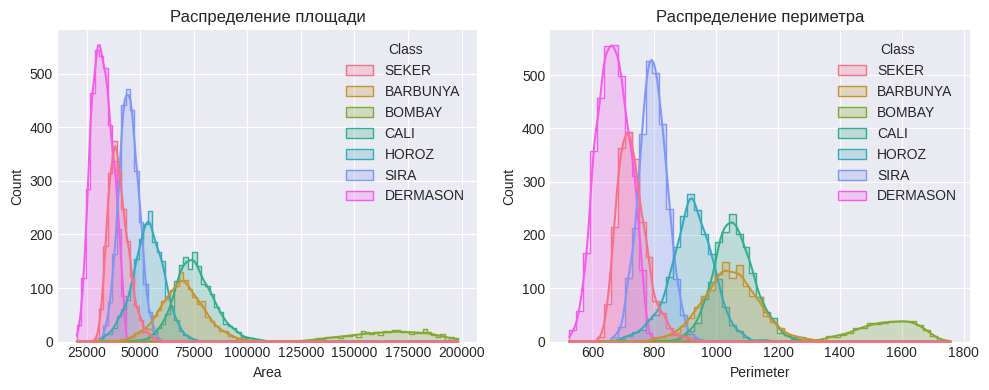

In [10]:
# Диаграммы распределения Area и Perimeter по классам
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
sns.histplot(
    data=df,
    x="Area",
    hue="Class",
    kde=True,
    element="step"
)
plt.title("Распределение площади")

plt.subplot(1, 2, 2)
sns.histplot(
    data=df,
    x="Perimeter",
    hue="Class",
    kde=True,
    element="step"
)
plt.title("Распределение периметра")
plt.tight_layout()
plt.show()

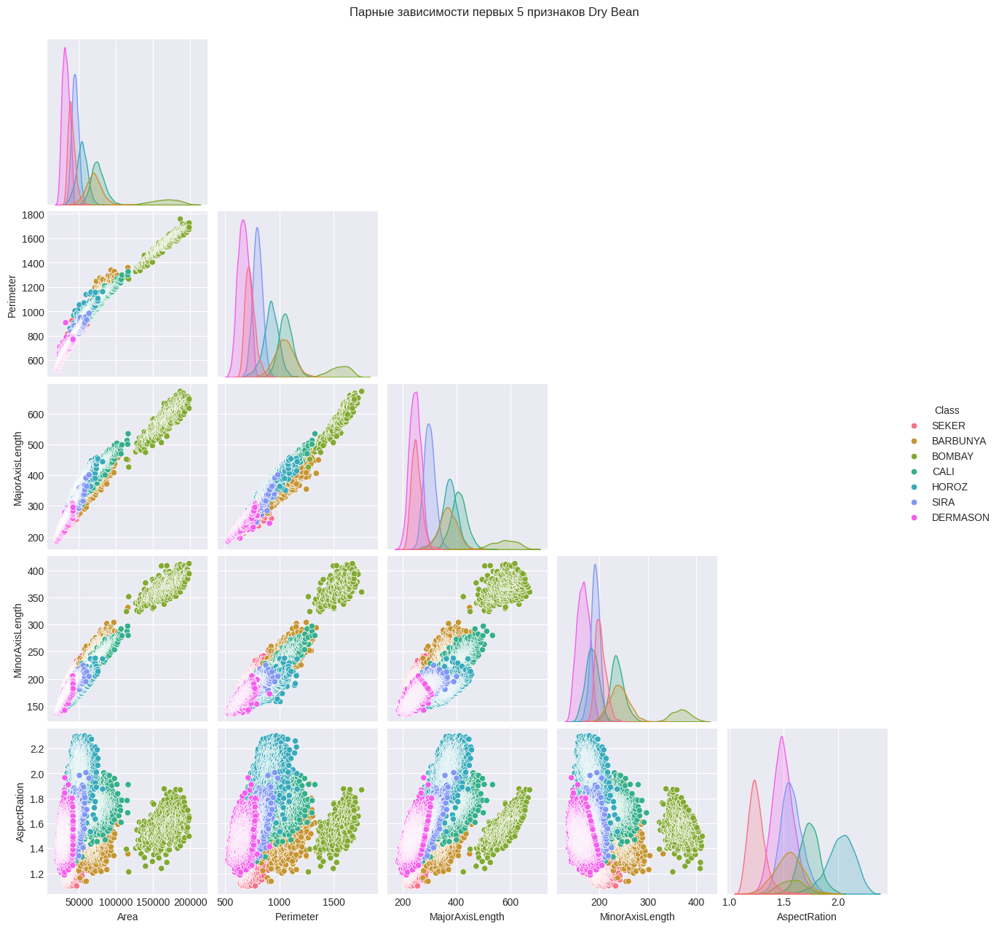

In [ ]:
# Парные диаграммы признаков (первые 5 признаков для читаемости)
sns.pairplot(
    df,
    vars=feature_names[:5],
    hue="Class",
    corner=True
)
plt.suptitle("Парные зависимости первых 5 признаков Dry Bean", y=1.02)
plt.show()

### Предварительная нормализация и UMAP-проекция

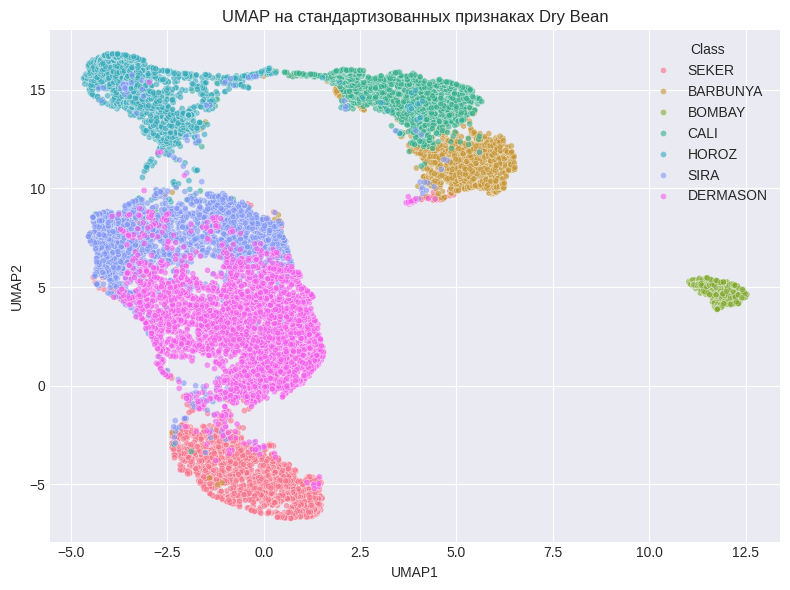

In [ ]:
X = df[feature_names].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

if HAS_UMAP:
    umap_model = umap.UMAP(
        n_neighbors=15,
        min_dist=0.1,
        n_components=2,
        n_jobs=-1
    )
    X_umap = umap_model.fit_transform(X_scaled)

    umap_df = pd.DataFrame(X_umap, columns=["UMAP1", "UMAP2"])
    umap_df["Class"] = df["Class"].values

    plt.figure(figsize=(8, 6))
    sns.scatterplot(
        data=umap_df,
        x="UMAP1",
        y="UMAP2",
        hue="Class",
        s=20,
        alpha=0.6
    )
    plt.title("UMAP на стандартизованных признаках Dry Bean")
    plt.tight_layout()
    plt.show()
else:
    print("UMAP не установлен. Установите: pip install umap-learn")

### Запуск полной визуализации через класс HighDimVisualizer

In [ ]:
# Маппинг числовых меток на имена классов
# В датасете Dry Bean 7 сортов бобов
class_names = sorted(df['Class'].unique())
class_to_idx = {name: idx for idx, name in enumerate(class_names)}

# Создаём числовой столбец target для визуализатора
df['target'] = df['Class'].map(class_to_idx)

target_class_names_dict = {idx: name for name, idx in class_to_idx.items()}
print("Маппинг классов:", target_class_names_dict)

Маппинг классов: {0: 'BARBUNYA', 1: 'BOMBAY', 2: 'CALI', 3: 'DERMASON', 4: 'HOROZ', 5: 'SEKER', 6: 'SIRA'}



Информация о данных:
  Размер: (13387, 16)
  Количество классов: 7
  Количество признаков: 16
  Минимум: -14.587, Максимум: 5.525
  Среднее: 0.000, Стандартное отклонение: 1.000
ПОЛНАЯ ВИЗУАЛИЗАЦИЯ МНОГОМЕРНЫХ ДАННЫХ

1. Парные диаграммы рассеяния (PairPlot)


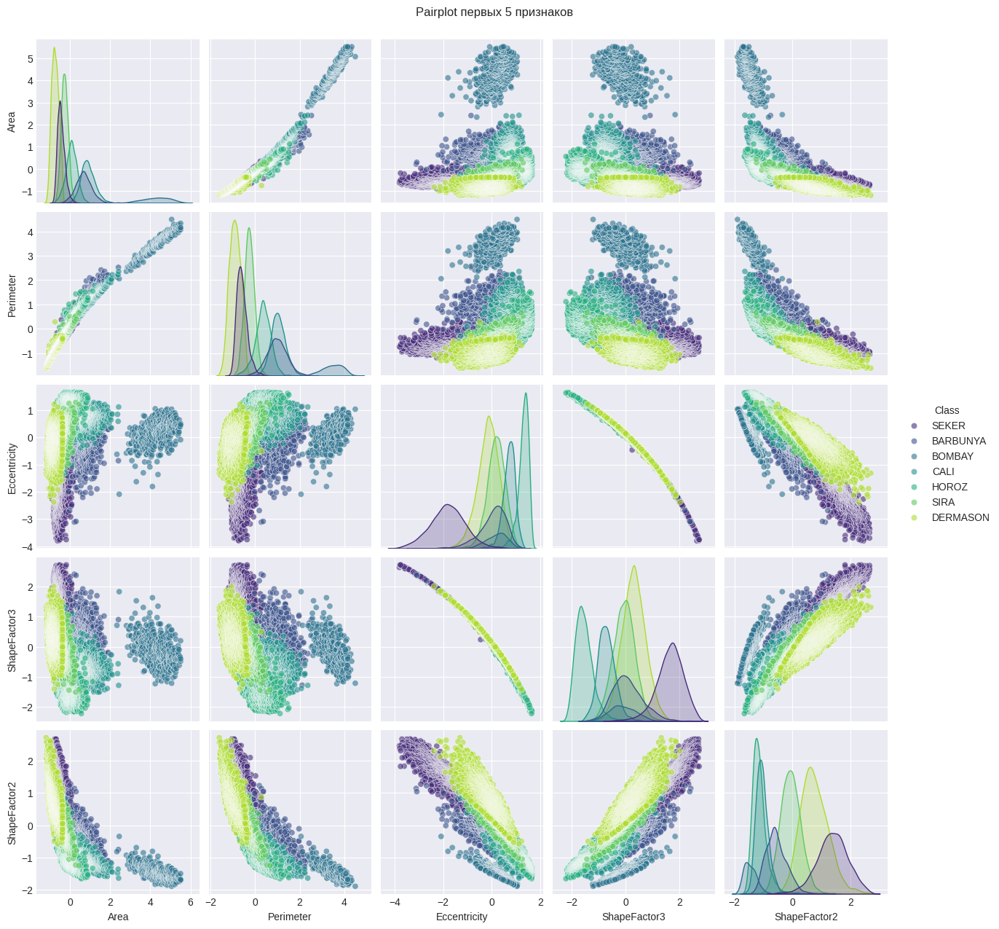


2. Тепловая карта корреляций


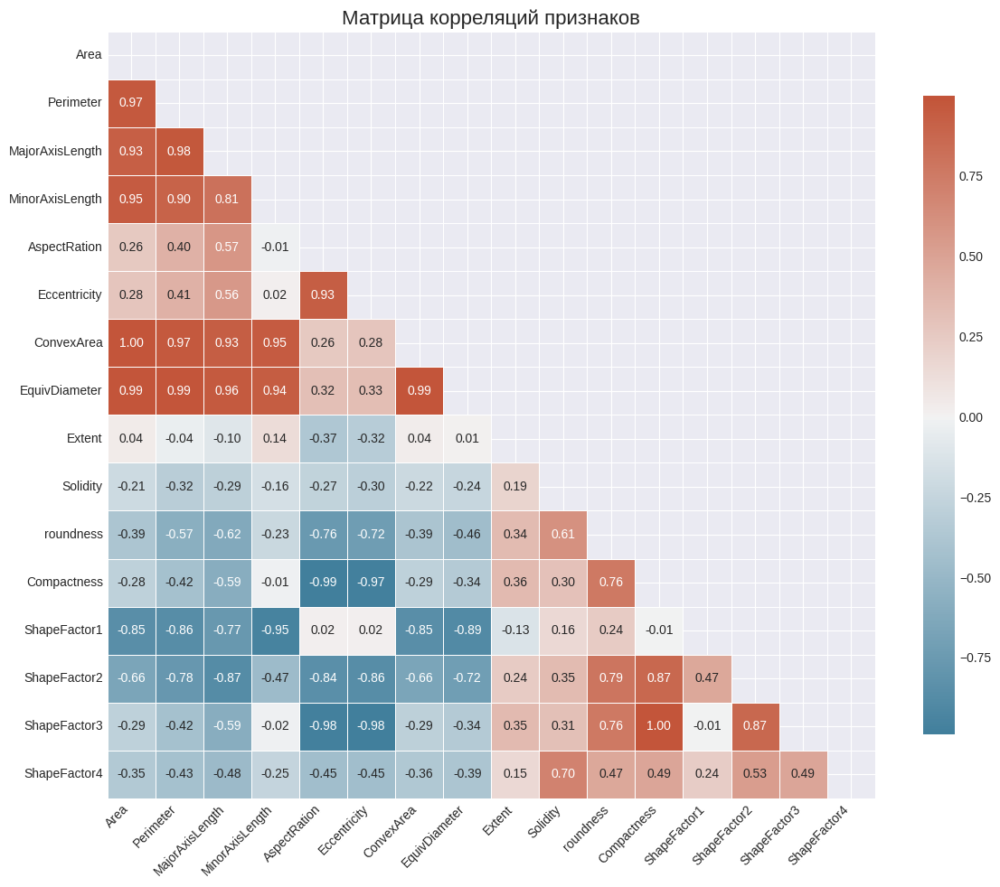


3. Визуализация PCA (2D и 3D)
Объясненная дисперсия: [0.55998284 0.260014   0.08014725]
Суммарная объясненная дисперсия: 0.900


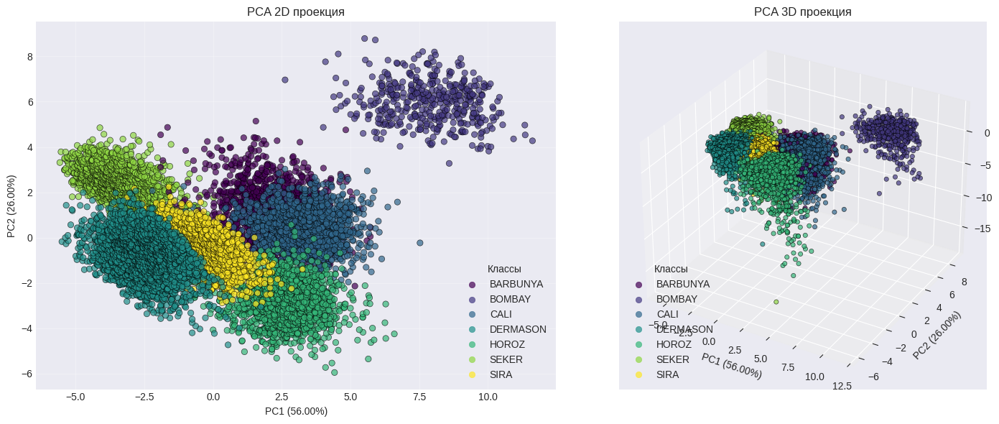

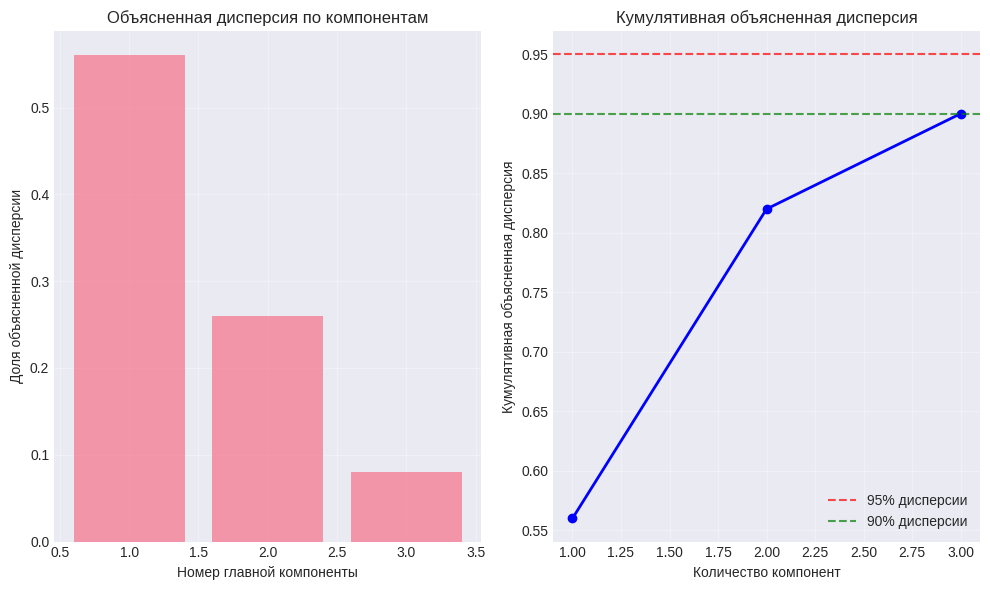


4. Визуализация t-SNE


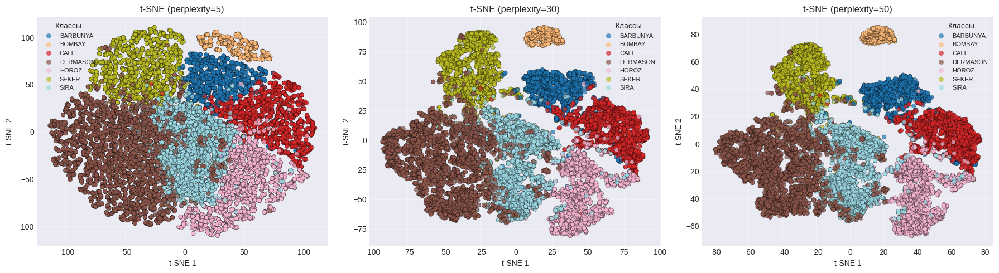


5. Визуализация UMAP


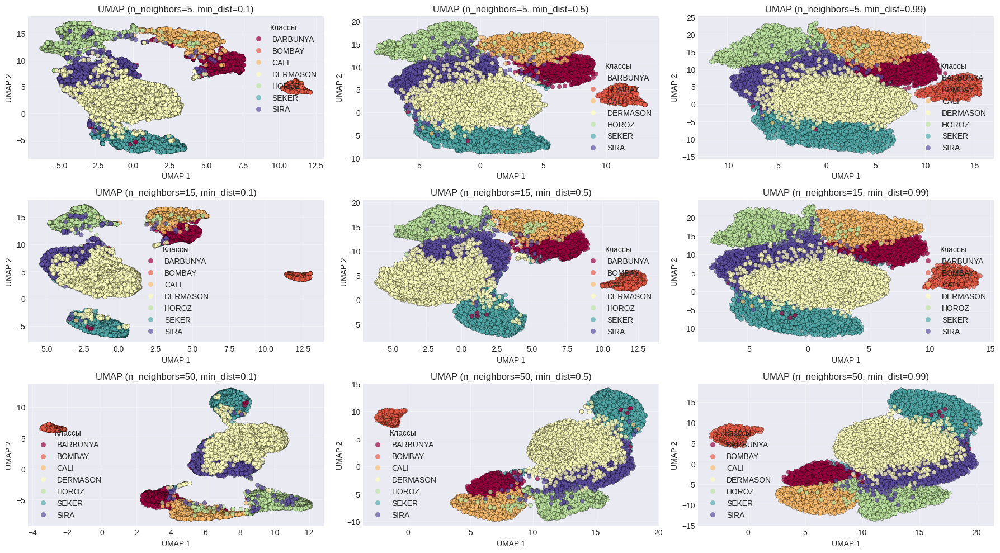


6. Параллельные координаты


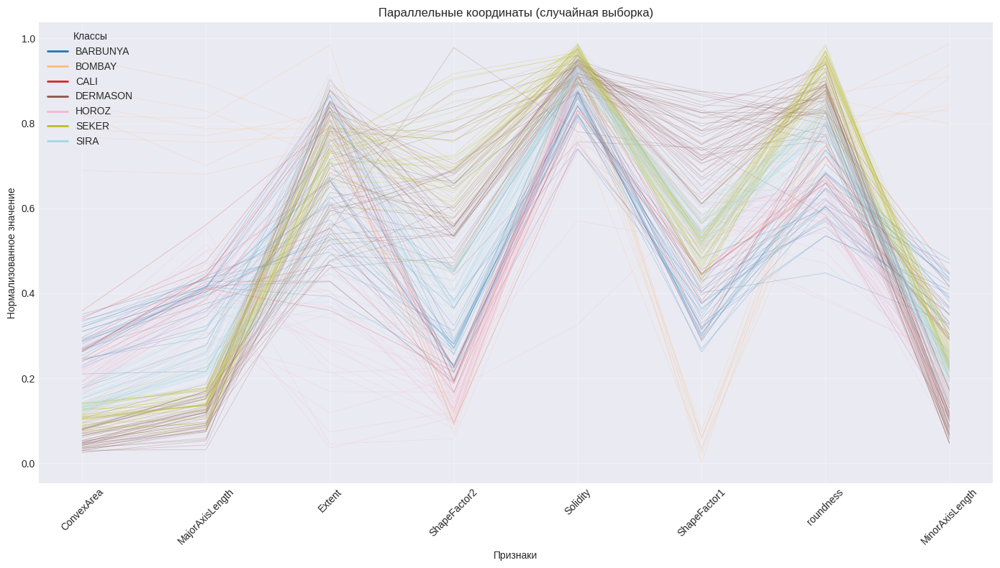


7. Радар-чарты по классам


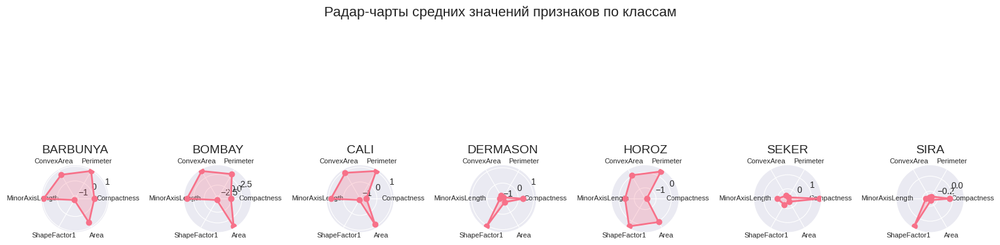


8. Интерактивная 3D визуализация (откроется в браузере)
  График сохранен в файл: interactive_3d_plot.html



9. Сравнение методов уменьшения размерности
  Применяем PCA...
  Применяем t-SNE...
  Применяем Isomap...
  Применяем UMAP...


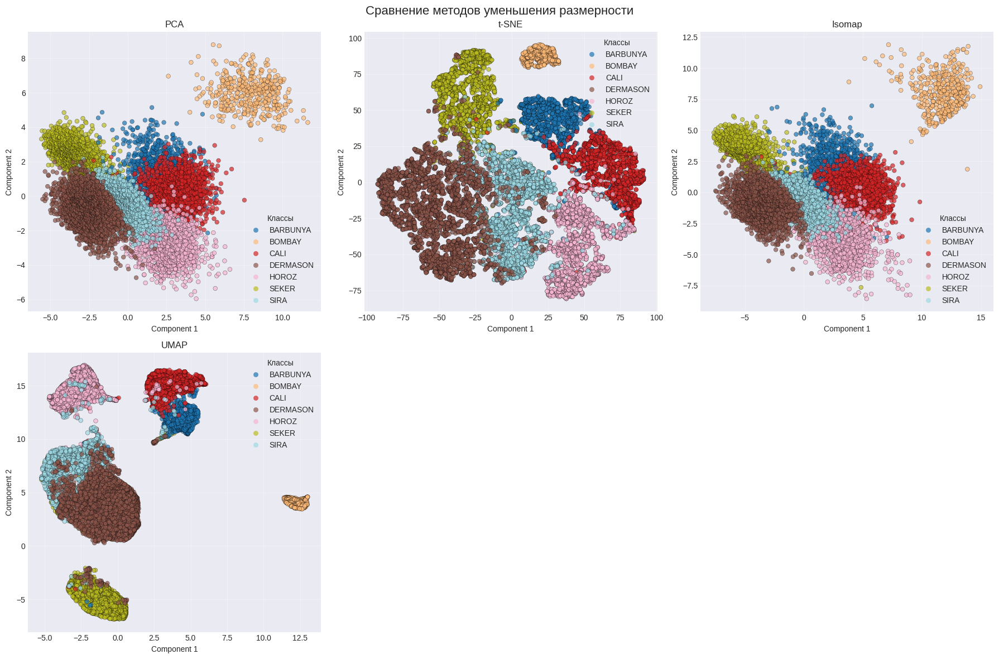


ВИЗУАЛИЗАЦИЯ ЗАВЕРШЕНА


In [ ]:
from multidim_visualization import HighDimVisualizer

visualizer = HighDimVisualizer(random_state=42)

# Убираем текстовый столбец Class перед загрузкой в визуализатор
df_vis = df.drop(columns=['Class'])

# Загрузка датасета и других параметров в визуализатор
# StandardScaler() добавлен для того, чтобы в радар-чартах была видна разница между классами,
# так как признаки находятся в разных масштабах (Area ~ десятки тысяч, ShapeFactor ~ доли единицы)
visualizer.load_dataset(df_vis, target_column='target', scaler=StandardScaler(), target_class_names=target_class_names_dict)

# Запуск визуализации
visualizer.run_full_visualization()